<h3>Exploratory data analysis</h3>

In [76]:
import pandas as pd
from plotly.offline import iplot
from datetime import datetime
from collections import Counter
import matplotlib.pyplot as plt
import cufflinks
cufflinks.go_offline(connected=True)

In [82]:
df = pd.read_csv('../Task_1/filtered.csv')
print(df.iloc[0:3])

        id                                              title  author_id  \
0  4442433  Манифест читателя (Как читать классическую лит...    1413157   
1  4442430  Призываются айтишники и сисадмины, а так же вс...     220928   
2  4442427  Советы 30-ти летнего 20-ти летним. Как заполуч...     557156   

     author_name  comments  rating rating_full                       date  \
0  Tolstoknijnik         8       0       17:28  2016-09-01T07:19:33+03:00   
1        axellly        29       0        2:20  2016-09-01T07:15:17+03:00   
2    pandakungfu       220     255      353:98  2016-09-01T07:12:35+03:00   

                                                tags  views  saves  \
0  ['Не мое', 'Чтение', 'Книги', 'Литература', 'Д...      0      1   
1  ['Компьютер', 'Компьютерщики', 'Компьютерное ж...      0      1   
2  ['[моё]', 'Советы 30-летнего', 'Френдзона', 'О...      0    297   

                                                text  length  
0    \nПисатель и критик соотносятся так ж

<h2>1. Introduction</h2>

<i>Descriptive statistics metrics using standard pandas tools. I should note that the fields "views" do not contain useful information. It seems that on the article page, getting information about the number of views is done in a different request.</i>

<i>We will assume that the information about the fields "comments", "rating", "saves" and "length" is useful, since the average value is different from 0.</i>

In [3]:
df.describe()

,id,author_id,comments,rating,views,saves,length
count,1.000440e+05,1.000440e+05,100044.000000,100044.000000,100044.0,100044.000000,100044.000000
mean,3.468027e+06,7.444998e+05,29.855414,144.428961,0.0,16.970853,4953.491834
std,9.687075e+05,4.168651e+05,70.883558,507.826876,0.0,208.899524,3503.896380
min,1.592637e+06,1.000000e+00,0.000000,-3592.000000,0.0,0.000000,2001.000000
25%,2.643682e+06,4.134880e+05,4.000000,0.000000,0.0,0.000000,2623.000000
50%,3.593692e+06,6.854050e+05,10.000000,0.000000,0.0,1.000000,3710.000000
75%,4.356841e+06,1.056157e+06,26.000000,42.000000,0.0,4.000000,6073.000000
max,4.900407e+06,1.677679e+06,3673.000000,14371.000000,0.0,28328.000000,29521.000000


<h3>2. Collection frequency analysis</h3>

In [4]:
df['length'].iplot(kind='hist', xTitle='length', yTitle='count', title='Article length distribution')

<h4>2.1 Relationship between length and text (by tags).</h4>

<i>It turned out to be an unusual graph, I would like to reveal the relationship between the length and the text info. I assume that having so many symbols is related to the consisted information.</i>

In [6]:
df_test = df.loc[(df['length'] >= 9800) & (df['length'] <= 10100)][['length', 'tags']]

print(df_test.iloc[0:3])

    length                                               tags
19    9809  ['Форт Боярд', 'Длиннопост', 'Длиннотекст', 'М...
34    9916  ['Creepy', 'Крипота', 'Рыбалка', 'Текст', 'Дли...
43    9975  ['[моё]', 'Рассказ', 'Короткий рассказ', 'Апок...


In [7]:
df_test['tags'].iplot(kind='hist', xTitle='tags', yTitle='count', title='Article tags distribution')

In [69]:
USE_TAGS = {}

def dictOfTags(tags):
    for tag in list(tags[1:-1].replace("'",'').split(', ')):
        if (tag in USE_TAGS.keys()):
            USE_TAGS.update({tag: USE_TAGS.get(tag) + 1})
        else:
            USE_TAGS.update({tag: 1})

In [71]:
for item in df_test['tags'].values:
    dictOfTags(item)

In [78]:
tags_counts = Counter(USE_TAGS)
most =  tags_counts.most_common(15)
print(most)

x = []
x_label = []

for i in most:
    x_label.append(i[0])
    x.append(i[1])

[('Текст', 4801), ('Длиннопост', 4611), ('[моё]', 1728), ('Рассказ', 969), ('Россия', 484), ('Не мое', 468), ('История', 453), ('Украина', 435), ('Длиннотекст', 393), ('Политика', 273), ('Фантастика', 171), ('Крипота', 165), ('Моё', 160), ('Мат', 158), ('Жизнь', 151)]


<i>The selected posts seem to have a "Длиннопост" tag. Many of them have a "Рассказ" tag. This explains the jump in the graph in the length of the article.</i>

([<matplotlib.axis.XTick at 0x2cf5aab50>,
 [Text(0, 0, 'Текст'),
  Text(1, 0, '[моё]'),
  Text(2, 0, 'Длиннопост'),
  Text(3, 0, 'Рассказ'),
  Text(4, 0, 'История'),
  Text(5, 0, 'Украина'),
  Text(6, 0, 'Россия'),
  Text(7, 0, 'Политика'),
  Text(8, 0, 'Моё'),
  Text(9, 0, 'Не мое'),
  Text(10, 0, 'Юмор'),
  Text(11, 0, 'Работа'),
  Text(12, 0, 'Истории из жизни'),
  Text(13, 0, 'Мат'),
  Text(14, 0, 'Жизнь')])

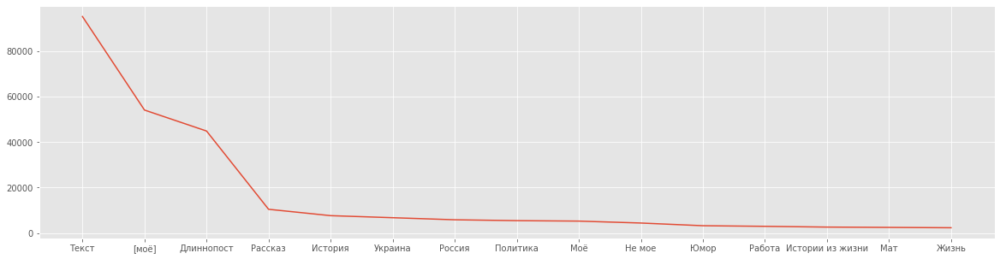

In [126]:
fig = plt.figure(figsize=(20, 5))
plt.style.use('ggplot')
plt.plot(range(len(x)), x)
plt.xticks(range(len(x)), x_label)

In [130]:
df['comments'].iplot(kind='hist', xTitle='comments', yTitle='count', title='Сount of comments distribution')

In [94]:
df['date'].iplot(kind='hist', xTitle='date', yTitle='count', title='Date distribution')

<h4>2.2 Week distribution analysis</h4>

<i>Lets try to show day of week distribution.</i>

In [97]:
import datetime

In [114]:
def dayOfWeek(date):
#     2016-09-01T07:19:33+03:00
    dt = datetime.datetime.strptime(date[0:10], "%Y-%m-%d")
    return dt.strftime("%A")

In [115]:
df['day'] = df.apply(lambda row: dayOfWeek(row['date']), axis=1)

<i>There were fewer publications over the weekend.</i>

In [129]:
df['day'].iplot(kind='hist', xTitle='Day', yTitle='count', title='Day distribution')

<h3>3. Using pandas profiling for analysis</h3>

<i>We will use a ready-made solution for data analysis. It turned out interestingly that the set contains duplicates of 'text' and 'title'. It should also be noted that the correlation (and different types of correlations) between the 'rating' and the number of comments is ~ 0.75. There is also a slight correlation between 'rating' and 'save', 'save' and 'comment'.</i>

In [119]:
import pandas_profiling

In [120]:
pandas_profiling.ProfileReport(df[['comments', 'rating', 'saves', 'length', 'text', 'title', 'author_id']])

Summarize dataset:   0%|          | 0/20 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h3>4. Prepare data. Lemmatization of text.</h3>

<i>Following the example (readme.md lemmatization), I tried to prepare the texts for further work.</i>

In [121]:
import nltk
nltk.download("stopwords")
from nltk.corpus import stopwords
from pymystem3 import Mystem
from string import punctuation
import numpy as np

mystem = Mystem() 
russian_stopwords = stopwords.words("russian")

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/alena.ogloblina/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [122]:
def preprocess_text(text):
    tokens = mystem.lemmatize(text.lower())
    tokens = [token for token in tokens if token not in russian_stopwords\
            and token != " " \
            and token.strip() not in punctuation]
    
    text = " ".join(tokens) 
    return text

In [123]:
df['lemmatization'] = df.apply(lambda row: preprocess_text(row['text']), axis=1)

In [124]:
print(df.iloc[0:2])

        id                                              title  author_id  \
0  4442433  Манифест читателя (Как читать классическую лит...    1413157   
1  4442430  Призываются айтишники и сисадмины, а так же вс...     220928   

     author_name  comments  rating rating_full                       date  \
0  Tolstoknijnik         8       0       17:28  2016-09-01T07:19:33+03:00   
1        axellly        29       0        2:20  2016-09-01T07:15:17+03:00   

                                                tags  views  saves  \
0  ['Не мое', 'Чтение', 'Книги', 'Литература', 'Д...      0      1   
1  ['Компьютер', 'Компьютерщики', 'Компьютерное ж...      0      1   

                                                text  length       day  \
0    \nПисатель и критик соотносятся так же, как ...    7148  Thursday   
1    Привет всем пикабушникам, этим холодным 1-се...    2838  Thursday   

                                       lemmatization  
0  писатель критик соотноситься астроном астролог.

In [125]:
df.to_csv('lem.csv', encoding='utf-8', index=False)